In [1]:
import networkx as nx
import pandas as pd
import mysql.connector
import matplotlib.pyplot as plt
import random
from collections import Counter
import csv
import community as community_louvain
import numpy as np
from node2vec import Node2Vec
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from datetime import datetime
import seaborn as sns
import plotly.express as px

In [2]:
conn = mysql.connector.connect(
    host="localhost",
    user="root",
    password="",
    database="reality_mining"
)

In [3]:
cursor = conn.cursor()

In [4]:
G = nx.Graph()

In [5]:
#Helper function to get label:oid to avoid overwriting
def node_key(oid, label):
    return f"{label}:{oid}"

In [6]:
#Add base nodes
def add_nodes(table_name, label):
    print(f"Adding nodes from '{table_name}' with label '{label}'")
    cursor.execute(f"SELECT oid FROM {table_name}")
    rows = cursor.fetchall()
    print(f"  - {len(rows)} rows fetched")
    for (oid,) in rows:
        G.add_node(node_key(oid, label), label=label)

In [7]:
#Adding Nodes to the Graph
add_nodes("person", "person")
add_nodes("device", "device")
add_nodes("phonenumber", "phonenumber")
add_nodes("celltower", "celltower")

Adding nodes from 'person' with label 'person'
  - 97 rows fetched
Adding nodes from 'device' with label 'device'
  - 20795 rows fetched
Adding nodes from 'phonenumber' with label 'phonenumber'
  - 3783 rows fetched
Adding nodes from 'celltower' with label 'celltower'
  - 32656 rows fetched


In [8]:
#Adding activity details to person nodes
cursor.execute("SELECT person_oid, starttime, endtime FROM activityspan")
activity_count = 0
for person_oid, starttime, endtime in cursor.fetchall():
    if person_oid is not None:
        key = node_key(person_oid, "person")
        if key not in G:
            G.add_node(key, label="person")
        G.nodes[key].setdefault("activities", []).append((starttime, endtime))
        activity_count += 1
print(f"Added {activity_count} activityspan records across person nodes")

Added 258967 activityspan records across person nodes


In [9]:
#Person to Device usage edges using devicespan table
cursor.execute("SELECT person_oid, device_oid, starttime, endtime FROM devicespan")
device_edges = 0
for person_oid, device_oid, starttime, endtime in cursor.fetchall():
    u = node_key(person_oid, "person")
    v = node_key(device_oid, "device")
    G.add_node(u, label="person")
    G.add_node(v, label="device")
    G.add_edge(u, v, label="uses_device", time_start=starttime, time_end=endtime)
    device_edges += 1
print(f"Added {device_edges} person-device edges.")

Added 285512 person-device edges.


In [10]:
#Person to phone number call edges using callspan table
cursor.execute("SELECT person_oid, phonenumber_oid, duration, starttime, endtime FROM callspan")
call_edges = 0
for person_oid, phone_oid, duration, starttime, endtime in cursor.fetchall():
    u = node_key(person_oid, "person")
    v = node_key(phone_oid, "phonenumber")
    G.add_node(u, label="person")
    G.add_node(v, label="phonenumber")
    G.add_edge(u, v, label="calls", duration=duration, time_start=starttime, time_end=endtime)
    call_edges += 1
print(f"Added {call_edges} person-phonenumber call edges.")

Added 897921 person-phonenumber call edges.


In [11]:
#Person to cell tower edges using cellspan table
cursor.execute("SELECT person_oid, celltower_oid, starttime, endtime FROM cellspan")
tower_edges = 0
for person_oid, tower_oid, starttime, endtime in cursor.fetchall():
    u = node_key(person_oid, "person")
    v = node_key(tower_oid, "celltower")
    G.add_node(u, label="person")
    G.add_node(v, label="celltower")
    G.add_edge(u, v, label="connected_to", time_start=starttime, time_end=endtime)
    tower_edges += 1
print(f"Added {tower_edges} person-celltower edges.")

Added 2536034 person-celltower edges.


In [12]:
#Node types
labels = [G.nodes[n].get('label', 'unknown') for n in G.nodes()]
print("Node types in graph:", Counter(labels))

Node types in graph: Counter({'celltower': 32656, 'device': 20795, 'phonenumber': 3783, 'person': 97})


In [13]:
print(f"Total Nodes in Graph: {len(G.nodes())}, Total Edges in Graph: {len(G.edges())}")

Total Nodes in Graph: 57331, Total Edges in Graph: 131230


In [14]:
# Sampling
degrees = dict(G.degree())
sorted_degrees = sorted(degrees.items(), key=lambda x: x[1], reverse=True)
#print(sorted_degrees[:5])

# Top 10 nodes based on degree
top_10_nodes = sorted_degrees[:10]
print(top_10_nodes)

[('person:86', 4130), ('person:1', 3919), ('person:78', 3854), ('person:57', 3618), ('person:17', 3538), ('person:29', 3110), ('person:74', 3092), ('person:22', 2925), ('person:8', 2924), ('person:35', 2924)]


In [15]:
# Create subgraph with important nodes (Based on degree threshold)
degree_threshold = 7
important_nodes = [node for node, deg in G.degree() if deg > degree_threshold]
subgraph = G.subgraph(important_nodes)

In [16]:
print(f"Total Nodes in Subgraph: {len(subgraph.nodes())}, Total Edges in Subgraph: {len(subgraph.edges())}")

Total Nodes in Subgraph: 2668, Total Edges in Subgraph: 44226


In [17]:
labels = [subgraph.nodes[n].get('label', 'unknown') for n in subgraph.nodes()]
print("Node types in subgraph:", Counter(labels))

Node types in subgraph: Counter({'celltower': 1733, 'device': 843, 'person': 89, 'phonenumber': 3})


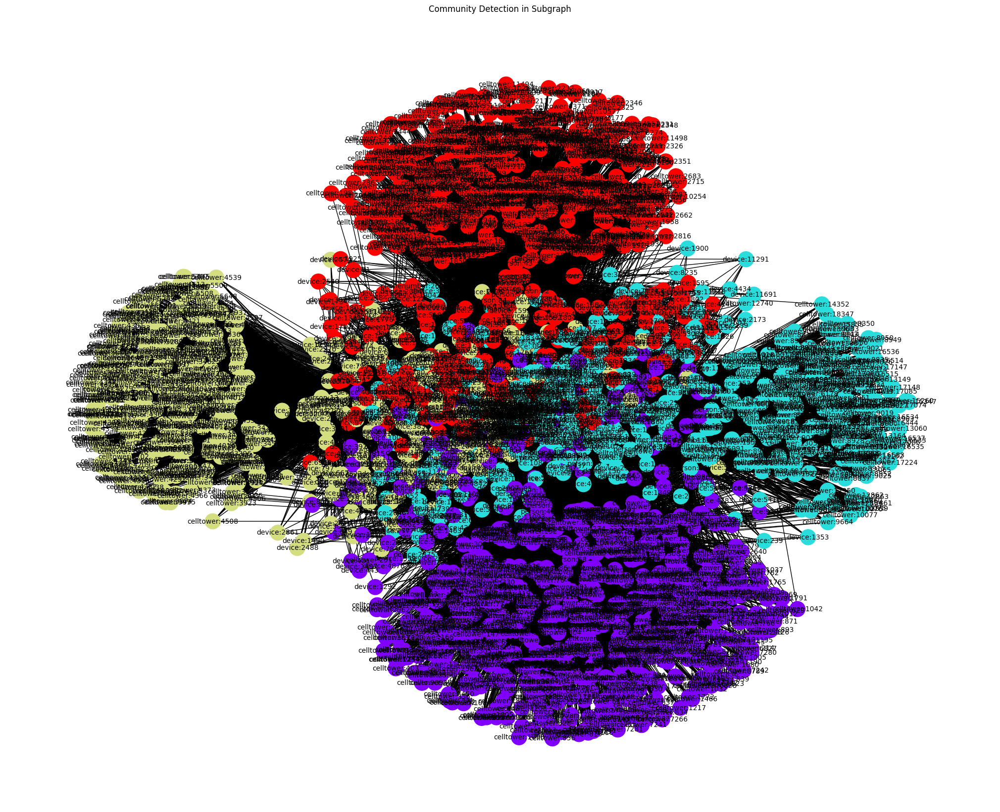

In [18]:
#Louvain community detection
partition = community_louvain.best_partition(subgraph)

plt.figure(figsize=(20, 16))
pos = nx.spring_layout(subgraph)
nx.draw(subgraph, pos, with_labels=True, node_color=list(partition.values()), cmap=plt.cm.rainbow, node_size=500, font_size=10)
plt.title("Community Detection in Subgraph")
plt.show()


In [19]:
#Embedding using node2Vec for subgraph
node2vec = Node2Vec(subgraph, dimensions=64, walk_length=30, num_walks=200, workers=2)

model = node2vec.fit(window=10, min_count=1, batch_words=4)


Computing transition probabilities:   0%|          | 0/2668 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 100/100 [02:17<00:00,  1.37s/it]


In [20]:
# Embedding for a node - sample
node_id = list(subgraph.nodes())[0]
embedding = model.wv[str(node_id)]

print(f"Embedding vector for node- {node_id}:", embedding)

Embedding vector for node- celltower:177: [-0.11597654 -0.12885366 -0.03992709  0.12517826 -0.20321727  0.19385657
  0.05277115 -0.03159771  0.32687533  0.24506305  0.0380412   0.32182524
 -0.12670702  0.19533162  0.19025227 -0.10045189  0.12413054  0.17414995
 -0.21181668 -0.09441175 -0.30969194 -0.1591198  -0.08407833 -0.0977804
 -0.06612168  0.04344905 -0.03998873  0.11443661  0.07649475  0.0254407
 -0.16922036  0.25438058  0.28178075 -0.04238642  0.30264717  0.05586914
 -0.23210365 -0.18148822 -0.01362443 -0.05128249 -0.23214254 -0.07309724
  0.22745207 -0.04157316 -0.1519206  -0.31599015 -0.06233809  0.14162119
  0.13939382 -0.03314751  0.34741765 -0.06953339  0.02434493 -0.20867614
 -0.12699512  0.30200943  0.17874795  0.44377828  0.5016469  -0.12166362
 -0.07530233 -0.16782518 -0.08140243 -0.36065662]


In [21]:
# All embeddings
embeddings = []
node_ids = []

for node in subgraph.nodes():
    embeddings.append(model.wv[str(node)])
    node_ids.append(node)

embeddings = np.array(embeddings)

print(f"Embeddings shape: {embeddings.shape}")

Embeddings shape: (2668, 64)


In [22]:
#Agglomerative Clustering
agglo = AgglomerativeClustering(n_clusters=4)
labels = agglo.fit_predict(embeddings)

node_cluster_map = {node: label for node, label in zip(node_ids, labels)}

for node, cluster_id in node_cluster_map.items():
    print(f"Node {node} assigned to Cluster {cluster_id}")


Node celltower:177 assigned to Cluster 2
Node celltower:1787 assigned to Cluster 2
Node device:252 assigned to Cluster 0
Node celltower:605 assigned to Cluster 2
Node device:283 assigned to Cluster 0
Node person:22 assigned to Cluster 0
Node device:67 assigned to Cluster 0
Node device:281 assigned to Cluster 0
Node celltower:1559 assigned to Cluster 0
Node device:105 assigned to Cluster 0
Node person:94 assigned to Cluster 2
Node device:327 assigned to Cluster 0
Node device:2392 assigned to Cluster 0
Node celltower:2043 assigned to Cluster 1
Node celltower:2173 assigned to Cluster 1
Node celltower:2094 assigned to Cluster 1
Node celltower:1890 assigned to Cluster 1
Node celltower:2550 assigned to Cluster 2
Node device:887 assigned to Cluster 0
Node celltower:8829 assigned to Cluster 0
Node celltower:1934 assigned to Cluster 1
Node celltower:1783 assigned to Cluster 2
Node device:410 assigned to Cluster 0
Node celltower:332 assigned to Cluster 2
Node celltower:2559 assigned to Cluster 2

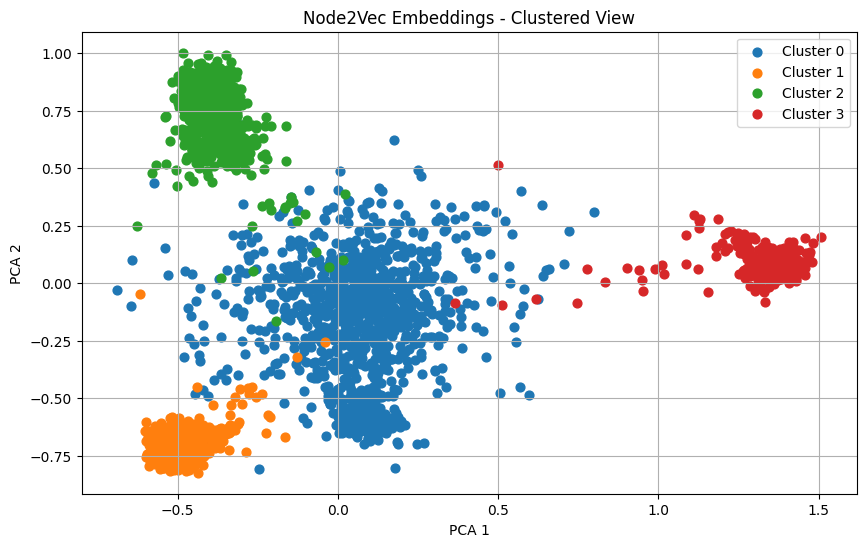

In [23]:
#PCA - Node2Vec Embeddings Clustered view
pca = PCA(n_components=2)
X_reduced = pca.fit_transform(embeddings)

plt.figure(figsize=(10, 6))
for cluster_id in np.unique(labels):
    idx = labels == cluster_id
    plt.scatter(X_reduced[idx, 0], X_reduced[idx, 1], label=f'Cluster {cluster_id}', s=40)

plt.legend()
plt.title('Node2Vec Embeddings - Clustered View')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.grid(True)
plt.show()


In [24]:
from sklearn.metrics import silhouette_score

score = silhouette_score(X_reduced, labels)
print(f"Silhouette Score after PCA: {score:.4f}")

Silhouette Score after PCA: 0.6613


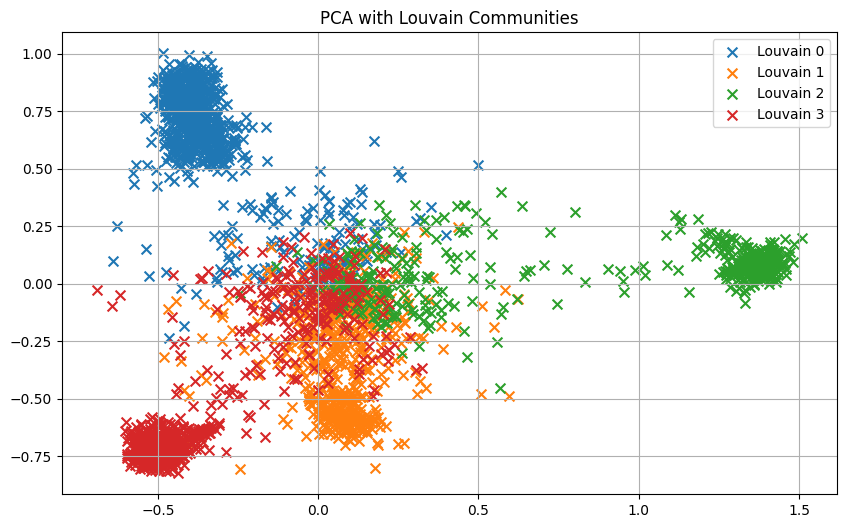

In [25]:
# Louvain - PCA
plt.figure(figsize=(10, 6))
for community_id in set(partition.values()):
    idx = [i for i, node in enumerate(node_ids) if partition[node] == community_id]
    plt.scatter(X_reduced[idx, 0], X_reduced[idx, 1], label=f'Louvain {community_id}', s=50, marker='x')

plt.title("PCA with Louvain Communities")
plt.legend()
plt.grid(True)
plt.show()


In [26]:
#Checking
person_oids_in_subgraph = [node for node, data in subgraph.nodes(data=True) if data['label'] == 'person']
print("Person oids in the subgraph:", person_oids_in_subgraph)


Person oids in the subgraph: ['person:22', 'person:94', 'person:93', 'person:14', 'person:35', 'person:19', 'person:43', 'person:27', 'person:24', 'person:6', 'person:29', 'person:76', 'person:91', 'person:80', 'person:38', 'person:10', 'person:82', 'person:65', 'person:73', 'person:17', 'person:26', 'person:84', 'person:39', 'person:15', 'person:77', 'person:44', 'person:30', 'person:90', 'person:36', 'person:28', 'person:11', 'person:34', 'person:4', 'person:31', 'person:33', 'person:86', 'person:32', 'person:71', 'person:59', 'person:75', 'person:97', 'person:61', 'person:96', 'person:13', 'person:69', 'person:1', 'person:16', 'person:70', 'person:56', 'person:12', 'person:18', 'person:89', 'person:45', 'person:58', 'person:20', 'person:74', 'person:81', 'person:8', 'person:88', 'person:21', 'person:5', 'person:54', 'person:37', 'person:47', 'person:41', 'person:51', 'person:83', 'person:62', 'person:46', 'person:3', 'person:95', 'person:63', 'person:78', 'person:49', 'person:42', '

In [27]:
print("Neighbors of node:", list(subgraph.neighbors('celltower:2352')))

Neighbors of node: ['person:43', 'person:21', 'person:62', 'person:42', 'person:57', 'person:80', 'person:10', 'person:38', 'person:39', 'person:30', 'person:28', 'person:74', 'person:72', 'person:50', 'person:86', 'person:37']


In [28]:
person_nodes = [node for node, attrs in subgraph.nodes(data=True) if attrs.get("label") == "person"]

random_person_node = random.choice(person_nodes)
person_edges = list(subgraph.edges(random_person_node))

node_info = subgraph.nodes[random_person_node]
print(f"Sample Person Node {random_person_node} Info: {node_info}")
print("**************")
print(f"Edges connected to Person Node {random_person_node}:")

for edge in person_edges:
    edge_info = subgraph[edge[0]][edge[1]]
    print(f"{edge} with attributes: {edge_info}")



Sample Person Node person:35 Info: {'label': 'person', 'activities': [(datetime.datetime(2004, 9, 13, 21, 37, 43), datetime.datetime(2004, 9, 13, 21, 38, 32)), (datetime.datetime(2004, 9, 14, 18, 9, 9), datetime.datetime(2004, 9, 14, 18, 10, 9)), (datetime.datetime(2004, 9, 14, 18, 29, 3), datetime.datetime(2004, 9, 14, 18, 30, 58)), (datetime.datetime(2004, 9, 14, 18, 33, 37), datetime.datetime(2004, 9, 14, 18, 35, 34)), (datetime.datetime(2004, 9, 20, 14, 34, 37), datetime.datetime(2004, 9, 20, 14, 34, 44)), (datetime.datetime(2004, 9, 20, 14, 39, 48), datetime.datetime(2004, 9, 20, 14, 44, 5)), (datetime.datetime(2004, 9, 20, 14, 57, 6), datetime.datetime(2004, 9, 20, 14, 58, 11)), (datetime.datetime(2004, 9, 20, 17, 21, 34), datetime.datetime(2004, 9, 20, 17, 22, 35)), (datetime.datetime(2004, 9, 20, 17, 22, 43), datetime.datetime(2004, 9, 20, 17, 24, 27)), (datetime.datetime(2004, 9, 20, 17, 25, 16), datetime.datetime(2004, 9, 20, 17, 26, 18)), (datetime.datetime(2004, 9, 20, 17, 

In [29]:
def circle_of_influence(person_node, subgraph, max_depth=3):
    influence = set()
    def dfs(node, depth):
        if depth > max_depth:
            return
        influence.add(node)
        for neighbor in subgraph.neighbors(node):
            if neighbor not in influence:
                dfs(neighbor, depth + 1)
    
    dfs(person_node, 0)  
    return influence

# Getting Circle of Influence for a Person Node
person_node = 'person:2'
circle_of_influence = circle_of_influence(person_node, subgraph)
print(f"Circle of Influence for {person_node}: {circle_of_influence}")

Circle of Influence for person:2: {'celltower:177', 'celltower:1787', 'device:252', 'celltower:605', 'device:283', 'device:67', 'device:281', 'celltower:1559', 'person:22', 'device:105', 'device:327', 'celltower:2043', 'device:2392', 'celltower:2173', 'celltower:2094', 'celltower:1890', 'celltower:2550', 'celltower:8829', 'device:887', 'celltower:1934', 'celltower:1783', 'device:410', 'celltower:332', 'celltower:2559', 'device:237', 'device:829', 'device:1800', 'device:107', 'device:25', 'celltower:536', 'device:11215', 'celltower:493', 'celltower:406', 'celltower:5499', 'device:72', 'celltower:411', 'celltower:253', 'device:7452', 'celltower:2011', 'celltower:459', 'celltower:607', 'celltower:2070', 'device:2470', 'celltower:4006', 'celltower:9011', 'device:168', 'device:123', 'celltower:476', 'celltower:10258', 'celltower:1080', 'celltower:347', 'celltower:73', 'celltower:230', 'celltower:8841', 'celltower:514', 'celltower:593', 'celltower:10577', 'celltower:3440', 'device:2548', 'ce

In [30]:
# Location based insights
# Load cellspan and celltower mapping
query = """
SELECT cs.person_oid, cs.starttime, cs.endtime, cs.celltower_oid, ct.name
FROM cellspan cs
JOIN celltower ct ON cs.celltower_oid = ct.oid
"""
cell_usage = pd.read_sql(query, conn)
cell_usage['starttime'] = pd.to_datetime(cell_usage['starttime'])
cell_usage['endtime'] = pd.to_datetime(cell_usage['endtime'])
cell_usage['duration'] = (cell_usage['endtime'] - cell_usage['starttime']).dt.total_seconds() / 60


/var/folders/95/29w8y2gn66vbkbwgmtckf5zm0000gn/T/ipykernel_26611/2605987876.py:8: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  cell_usage = pd.read_sql(query, conn)


In [31]:
cell_usage.head()

,person_oid,starttime,endtime,celltower_oid,name,duration
0,94,2004-07-23 12:22:34,2004-07-23 12:23:56,38,"0,",1.366667
1,94,2004-07-23 12:23:56,2004-07-23 12:25:10,39,"883, AT&T Wirel",1.233333
2,94,2004-07-23 12:25:10,2004-07-23 12:26:15,38,"0,",1.083333
3,94,2004-07-23 12:26:15,2004-07-23 12:27:24,39,"883, AT&T Wirel",1.150000
4,94,2004-07-23 12:27:24,2004-07-23 12:28:36,40,"2353, AT&T Wirel",1.200000


In [32]:
# Total time spent per tower per person
tower_time = cell_usage.groupby(['person_oid', 'celltower_oid', 'name'])['duration'].sum().reset_index()
tower_time = tower_time.sort_values(['person_oid', 'duration'], ascending=[True, False])

In [33]:
tower_time.head()

,person_oid,celltower_oid,name,duration
490,1,15370,"2212, Orange",38481.433333
489,1,15369,"9392, Orange",26214.683333
496,1,15376,"9800, Orange",9169.916667
518,1,15398,"38293, Orange",7473.450000
1,1,38,"0,",5977.316667


In [34]:
# Get top 3 towers used per person
top_towers = tower_time.groupby('person_oid').head(3)
top_towers[:5]

,person_oid,celltower_oid,name,duration
490,1,15370,"2212, Orange",38481.433333
489,1,15369,"9392, Orange",26214.683333
496,1,15376,"9800, Orange",9169.916667
1575,2,4539,"41742, T - Mobile",3463.216667
1558,2,38,"0,",2828.416667


In [35]:
person_oid = 12
top_towers[top_towers['person_oid']==person_oid]

,person_oid,celltower_oid,name,duration
9779,12,4014,"44152, T - Mobile",30780.533333
9677,12,3392,"40332, T - Mobile",25051.350000
9678,12,3393,"40811, T - Mobile",9356.800000


In [36]:
# Add hour of day
cell_usage['hour'] = cell_usage['starttime'].dt.hour

def categorize_time(hour):
    if 6 <= hour < 10:
        return "morning"
    elif 10 <= hour < 18:
        return "work"
    elif 18 <= hour < 21:
        return "evening"
    else:
        return "night"

cell_usage['time_category'] = cell_usage['hour'].apply(categorize_time)

# Aggregation - total time spent on each cell tower by each person
home_work = cell_usage.groupby(['person_oid', 'celltower_oid', 'name', 'time_category'])['duration'].sum().reset_index()
home_work_pivot = home_work.pivot_table(index=['person_oid', 'name'], columns='time_category', values='duration', fill_value=0)

# Heuristics - A cell tower with more night/evening activity is likely a home tower
# A cell tower with more morning/work activity is likely a work tower
home_work_pivot["home_score"] = home_work_pivot.get("night", 0) + home_work_pivot.get("evening", 0)
home_work_pivot["work_score"] = home_work_pivot.get("work", 0) + home_work_pivot.get("morning", 0)

# Top home/work towers
home_towers = home_work_pivot.groupby("person_oid")["home_score"].idxmax().apply(lambda x: x[1])
work_towers = home_work_pivot.groupby("person_oid")["work_score"].idxmax().apply(lambda x: x[1])


In [37]:
# Number of unique towers per person as a mobility indicator
mobility_score = cell_usage.groupby('person_oid')['celltower_oid'].nunique().reset_index()
mobility_score.columns = ['person_oid', 'unique_tower_count']


In [38]:
person_id = 12

home_tower = home_towers.get(person_id, "Not Found")
work_tower = work_towers.get(person_id, "Not Found")

print(f"Home Tower for {person_id}: {home_tower}")
print(f"Work Tower for {person_id}: {work_tower}")


Home Tower for 12: 44152, T - Mobile
Work Tower for 12: 40332, T - Mobile


In [39]:
person_id = 12
person_usage = cell_usage[cell_usage['person_oid'] == person_id].copy()
person_usage['date'] = person_usage['starttime'].dt.date

fig = px.bar(
    person_usage,
    x='date',
    y='duration',
    color='name',
    title=f"Daily Tower Usage for Person {person_id}",
    labels={'duration': 'Duration (minutes)', 'date': 'Date', 'name': 'Tower Name'},
    height=600,
)

fig.update_layout(
    xaxis_tickangle=-45,
    legend_title_text='Tower Name',
    margin=dict(t=60, b=80, r=100),
)

fig.show()

In [40]:
#Churn
# Load dataset time range to get start and end time of records
query = """
SELECT MIN(starttime) as start_time, MAX(endtime) as end_time
FROM callspan
"""
time_bounds = pd.read_sql(query, conn)
dataset_start = pd.to_datetime(time_bounds['start_time'].iloc[0])
dataset_end = pd.to_datetime(time_bounds['end_time'].iloc[0])

print(f"Dataset spans from {dataset_start.date()} to {dataset_end.date()}")


/var/folders/95/29w8y2gn66vbkbwgmtckf5zm0000gn/T/ipykernel_26611/1862627836.py:7: UserWarning:

pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.



Dataset spans from 2004-01-19 to 2005-05-05


In [41]:
query = """
SELECT person_oid, starttime, endtime, duration, direction, callid
FROM callspan
"""
call_df = pd.read_sql(query, conn)
call_df['starttime'] = pd.to_datetime(call_df['starttime'])
call_df['endtime'] = pd.to_datetime(call_df['endtime'])

call_behavior = call_df.groupby('person_oid').agg(
    total_calls=('callid', 'count'),
    total_duration=('duration', 'sum'),
    avg_duration=('duration', 'mean'),
    first_call=('starttime', 'min'),
    last_call=('endtime', 'max'),
    incoming_calls=('direction', lambda x: (x == 'incoming').sum()),
    outgoing_calls=('direction', lambda x: (x == 'outgoing').sum())
).reset_index()

call_behavior['active_days'] = (call_behavior['last_call'] - call_behavior['first_call']).dt.days.clip(lower=1)
call_behavior['incoming_ratio'] = call_behavior['incoming_calls'] / call_behavior['total_calls']
call_behavior['outgoing_ratio'] = call_behavior['outgoing_calls'] / call_behavior['total_calls']
call_behavior['activity_density'] = call_behavior['total_calls'] / call_behavior['active_days']
call_behavior['person_node'] = 'person:' + call_behavior['person_oid'].astype(str)


/var/folders/95/29w8y2gn66vbkbwgmtckf5zm0000gn/T/ipykernel_26611/1684810219.py:5: UserWarning:

pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.



In [42]:
def churn_check(person_node, subgraph, max_inactivity_days=30, min_interactions=5, reference_time=None):
    if person_node not in subgraph.nodes:
        return None

    if reference_time is None:
        reference_time = dataset_end

    interactions = 0
    last_interaction_time = dataset_start
    total_duration = 0
    directions = []

    for neighbor in subgraph.neighbors(person_node):
        edge_data = subgraph[person_node][neighbor]
        interaction_time = edge_data.get('time_start', dataset_start)
        interaction_duration = edge_data.get('duration', 0)
        direction = edge_data.get('direction')

        last_interaction_time = max(last_interaction_time, interaction_time)
        interactions += 1
        total_duration += interaction_duration
        if direction:
            directions.append(direction)
    
    days_since_last = (reference_time - last_interaction_time).days

    if interactions < min_interactions:
        churn_risk = 'High'
    elif days_since_last > max_inactivity_days:
        churn_risk = 'Moderate'
    else:
        churn_risk = 'Low'
    
    return {
        'person_node': person_node,
        'churn_risk': churn_risk,
        'interactions': interactions,
        'days_since_last': days_since_last,
        'avg_duration_graph': total_duration / interactions if interactions else 0,
        'incoming_ratio_graph': directions.count('incoming') / len(directions) if directions else 0
    }


In [43]:
churn_results = []
for node in subgraph.nodes:
    if node.startswith('person:'):
        results = churn_check(node, subgraph)
        if results:
            churn_results.append(results)

churn_df = pd.DataFrame(churn_results)


In [44]:
full_churn_feat = churn_df.merge(call_behavior, on='person_node', how='left')

In [45]:
fig = px.box(
    full_churn_feat,
    x='churn_risk',
    y='activity_density',
    title="Activity Density vs Churn Risk",
    labels={'churn_risk': 'Churn Risk', 'activity_density': 'Activity Density'}
)

fig.show()

#full_churn_feat.to_csv("churn_features_complete.csv", index=False)

In [ ]:
#GraphRAG

In [46]:
from langchain.schema import Document

def graph_to_documents(subgraph):
    docs = []
    for node in subgraph.nodes(data=True):
        node_id, attrs = node
        connections = list(subgraph.neighbors(node_id))
        edge_info = []
        for neighbor in connections:
            edge_data = subgraph.get_edge_data(node_id, neighbor)
            edge_info.append(f"Connected to {neighbor} via {edge_data}")
        
        text = f"Node {node_id} with attributes {attrs}. " \
               f"Connections: {'; '.join(edge_info)}"
        docs.append(Document(page_content=text, metadata={"node_id": node_id}))
    
    return docs

graph_docs = graph_to_documents(subgraph)


In [64]:
import os

os.environ["OPENAI_API_KEY"] = "xyz"

In [58]:
from langchain_openai import OpenAIEmbeddings
from langchain.vectorstores import FAISS
from tqdm import tqdm

MAX_DOC_TOKENS = 500

def truncate_text(text, max_words=300):
    words = text.split()
    return ' '.join(words[:max_words])

def graph_to_documents(subgraph):
    docs = []
    for node_id, attrs in tqdm(subgraph.nodes(data=True)):
        connections = list(subgraph.neighbors(node_id))
        edge_info = []
        for neighbor in connections:
            edge_data = subgraph.get_edge_data(node_id, neighbor)
            edge_info.append(f"Connected to {neighbor} via {edge_data}")
        
        text = f"Node {node_id} with attributes {attrs}. Connections: {'; '.join(edge_info)}"
        text = truncate_text(text, max_words=300)

        docs.append(Document(page_content=text, metadata={"node_id": node_id}))
    
    return docs

graph_docs = graph_to_documents(subgraph)

embedding = OpenAIEmbeddings()

vectorstore = FAISS.from_documents(graph_docs[:500], embedding)
for i in tqdm(range(500, len(graph_docs), 500)):
    batch = graph_docs[i:i+500]
    faiss_tmp = FAISS.from_documents(batch, embedding)
    vectorstore.merge_from(faiss_tmp)


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [01:45<00:00, 21.09s/it]


In [60]:
#Retrieval
from langchain_openai import ChatOpenAI
from langchain.chains import RetrievalQA

llm = ChatOpenAI(temperature=0.2)
qa_chain = RetrievalQA.from_chain_type(llm=llm, retriever=vectorstore.as_retriever())


In [63]:
#Response
query = "What can you state about person_oid 12?"
response = qa_chain.invoke({"query": query})
print(response)


{'query': 'What can you state about person_oid 12?', 'result': 'Person with ID 12 has been connected to device 11213 on October 12, 2004, from 11:12:06 to 11:22:32. Additionally, this person has been connected to device 12 on various occasions with different time intervals.'}
